## <img src="./logo_UTN.svg" align="right" width="150" /> 
#### Procesamiento Digital de Señales

# Trabajo Práctico 3
#### Nombre y Apellido: Juan Lauría

***
## Estimación espectral


<div class="alert alert-block alert-info">
<b>1)</b> Compruebe experimentalmente las propiedades de sesgo y varianza del periodograma.
</div>

<div class="alert alert-block alert-success">
<b>Ayuda:</b> Puede utilizar una señal aleatoria con valores normalmente distribuidos de media nula y varianza **NO** unitaria, es decir $ x \sim \mathcal{N}(\mu=0,\sigma^2=2)$

</div>

Es decir, que el periodograma es un estimador de la densidad de potencia espectral (Ver Hayes 8.2.2):

$$ \hat{P_P}(e^{\frac{2\pi·k·f_S}{N}}) = \hat{P_P}(k) = \frac{1}{N}· \lvert X(k) \rvert ^2  $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza constante y **NO** depende de N.

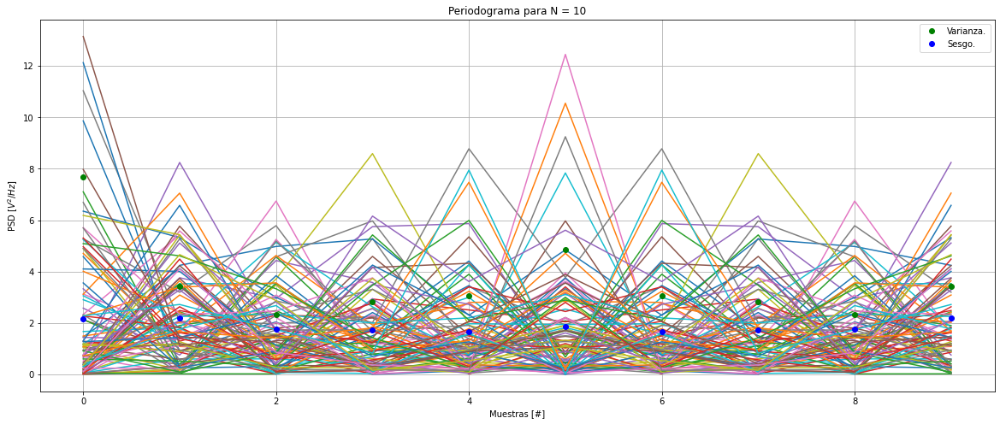

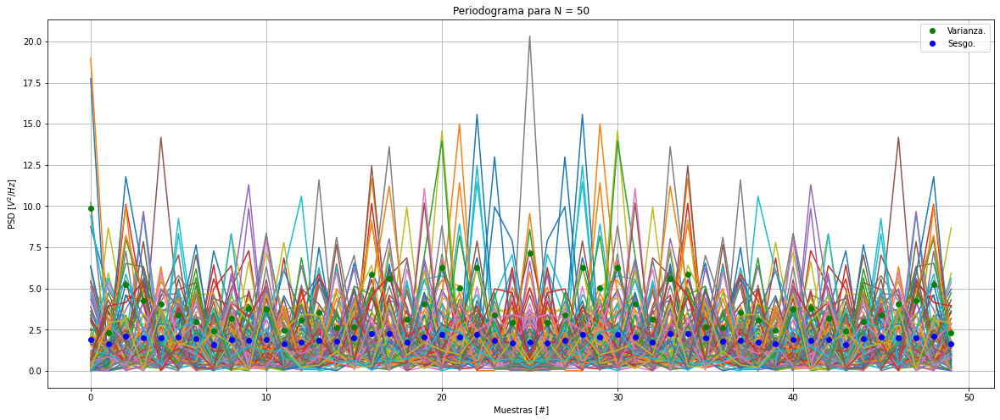

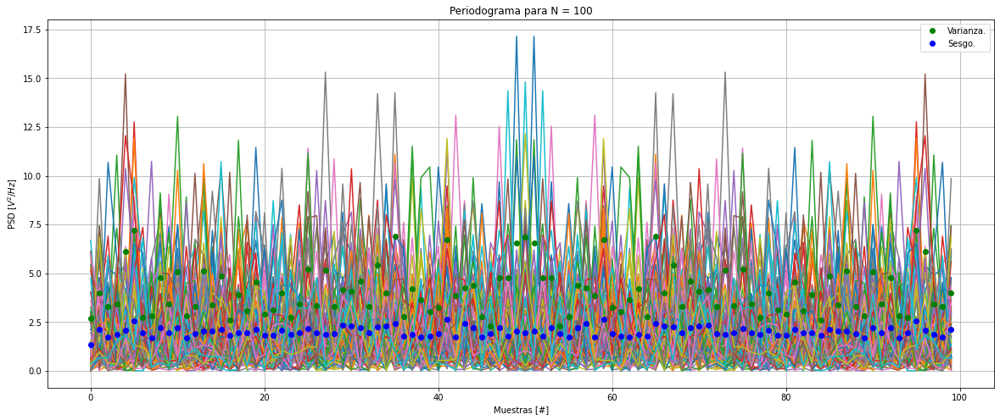

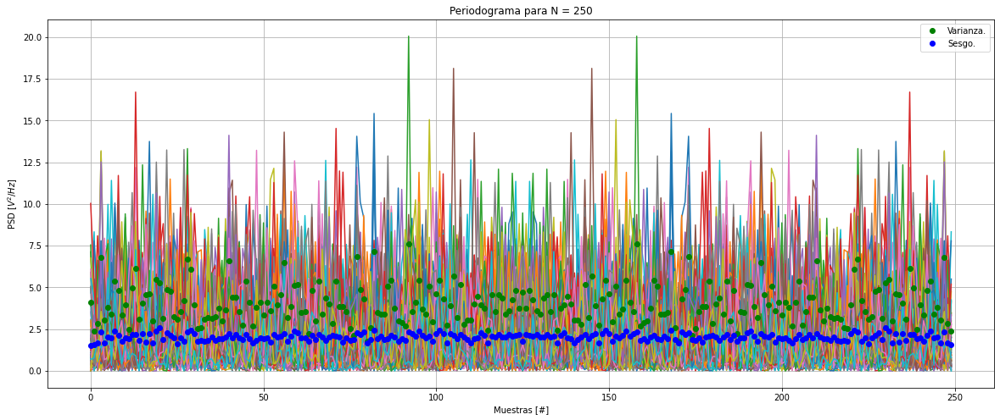

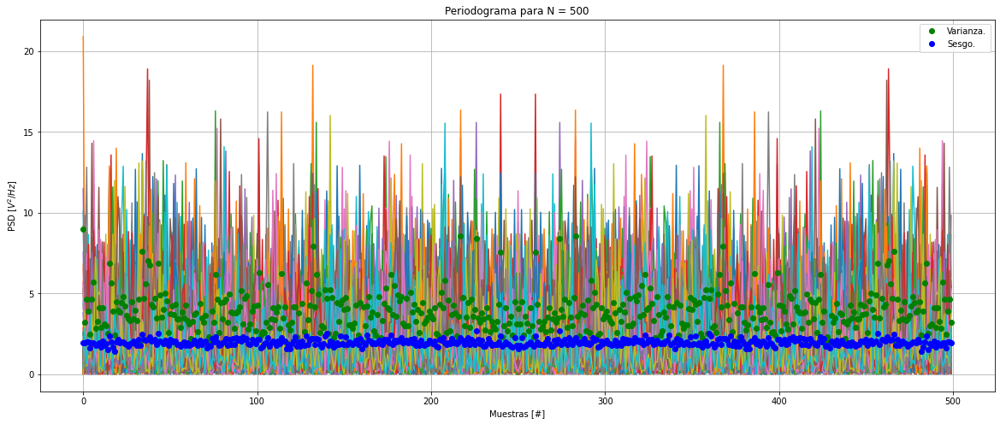

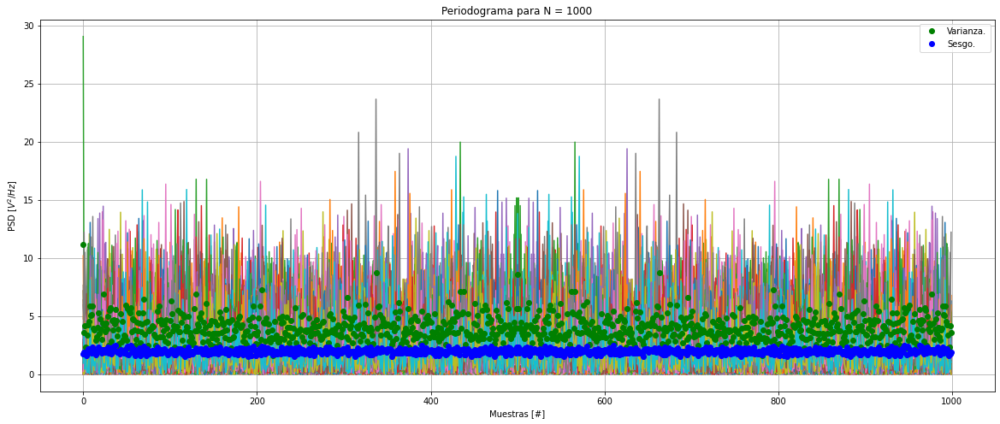

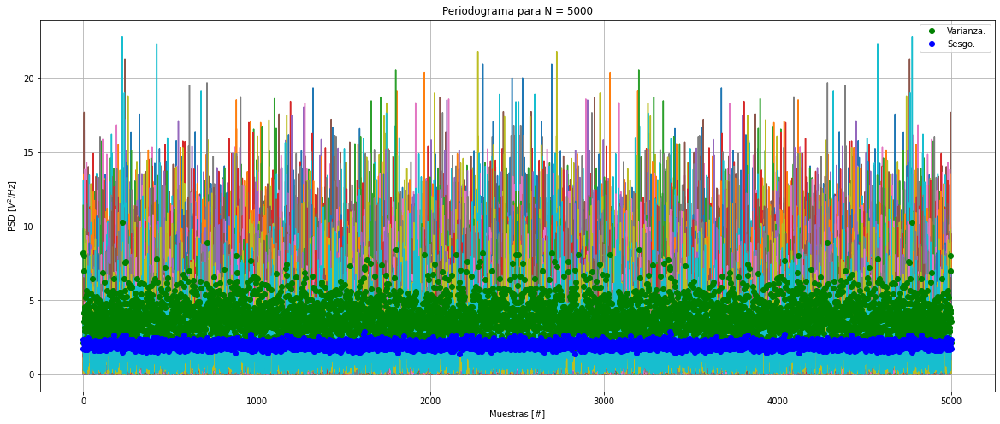

In [3]:
import numpy as npy
import scipy as spy
import matplotlib.pyplot as plt

N = npy.array([10, 50, 100, 250, 500, 1000, 5000])
fs = 1000
sigma = 2
mu = 0
M = 100 # Realizaciones de señal.

sesgo = []
varianza = []
matrix = []

k = 0

for i in N:    
    # Creo una matriz de muestras N x M y su espectro.
    x = npy.random.normal(mu,npy.sqrt(sigma),(i,M))
    px = (abs(npy.fft.fft(x,i,axis=0)) ** 2) / i
    
    var = npy.var(px,axis=1) # Vector columna de la varianza para cada bin.
    varianza.append(npy.mean(var)) # Vector columna de la varianza para cada bin.
    
    ses = npy.mean(px,axis=1) # Varianza para cada espectro.
    sesgo.append(npy.mean(ses) - sigma) # Sesgo para cada espectro.
                                        # Parámetro real - estimador
    
    
    # Ploteos
    plt.figure(k,figsize=(20,8))
    plt.plot(px)
    plt.plot(var,'go',label='Varianza.')
    plt.plot(ses,'bo',label='Sesgo.')
    plt.title('Periodograma para N = ' + str(i))
    plt.xlabel('Muestras [#]')
    plt.ylabel('PSD [$V^2 / Hz$]')
    plt.legend()
    plt.grid()
    k=k+1

In [25]:

tus_resultados_per = []
tus_resultados_per.append([sesgo[0],varianza[0]])
tus_resultados_per.append([sesgo[1],varianza[1]])
tus_resultados_per.append([sesgo[2],varianza[2]])
tus_resultados_per.append([sesgo[3],varianza[3]])
tus_resultados_per.append([sesgo[4],varianza[4]])
tus_resultados_per.append([sesgo[5],varianza[5]])
tus_resultados_per.append([sesgo[6],varianza[6]])

#######################################
# Tu simulación que genere resultados #
#######################################
"""
tus_resultados_per = [ 
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                 ]"""


df = DataFrame(tus_resultados_per, columns=['$s_P$', '$v_P$'],
               index=N)
HTML(df.to_html())


,$s_P$,$v_P$
10,0.132993,5.439915
50,0.064213,4.314865
100,0.023143,4.102225
250,0.026252,4.005276
500,0.011551,4.072360
1000,0.010117,3.998560
5000,-0.003422,3.943325


<div class="alert alert-block alert-warning">
<b>Comentario:</b> Realizando las simulaciones determiné que a mayor cantidad de realizaciones (M) mejor es la visualiación del sesgo y la varianza en los ploteos. Con 10 visualizaciones no se lograba apreciar visualmente hacia donde tendía la varianza ya que presentaba mucha dispersión entre cada valor del vector. También se reduce la dispersión con un mayor número de N.
    
Respecto al periodograma, se puede apreciar que la varianza no tiende a 0 a medida que el número de muestras N se va haciendo mayor, sino que tiende a $\sigma^4=4$ como se observa en la tabla. Además el sesgo es cercano a 0 y decrece al aumentar N. De esta manera puedo comprobar que asintóticamente insesgado.
</div>

<div class="alert alert-block alert-info">
<b>2)</b>     Compruebe del mismo modo los resultados de sesgo y varianza vistos en la teoría del método de Bartlett.

</div>

Es decir, que el periodograma de Bartlett es un estimador de la densidad de potencia espectral que promedia K bloques disjuntos de las N muestras de una señal $x$ (Ver Hayes 8.2.4):

$$ \hat{P_B}(k) = \frac{1}{N}· \sum^{K-1}_{i=0} \lvert X(k) \rvert ^2  $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza que decrece asintóticamente a medida que aumenta K.
 + tiene una resolución espectral K veces menor

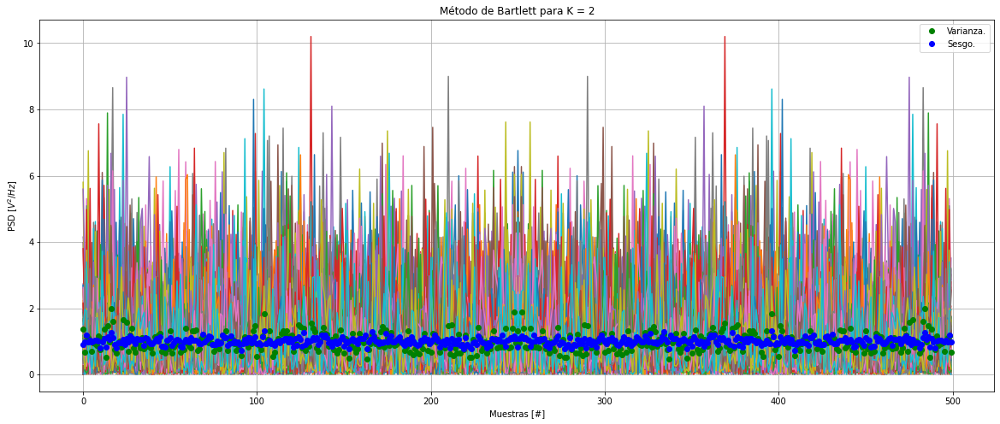

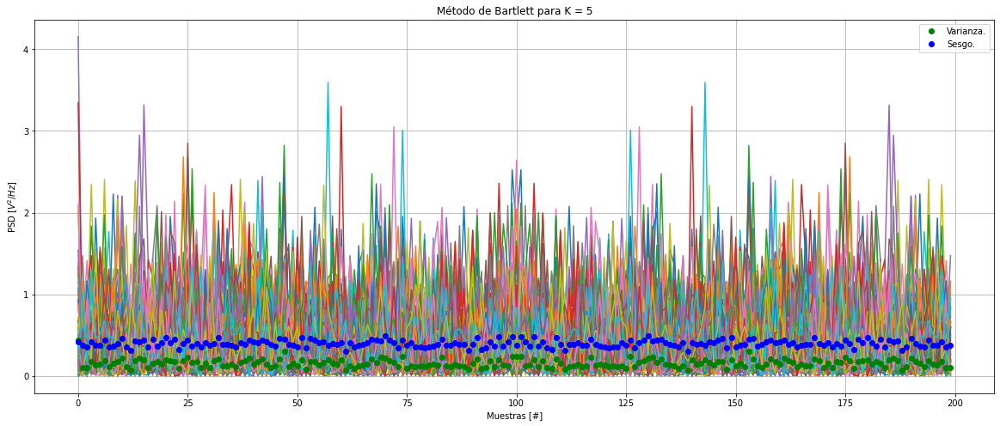

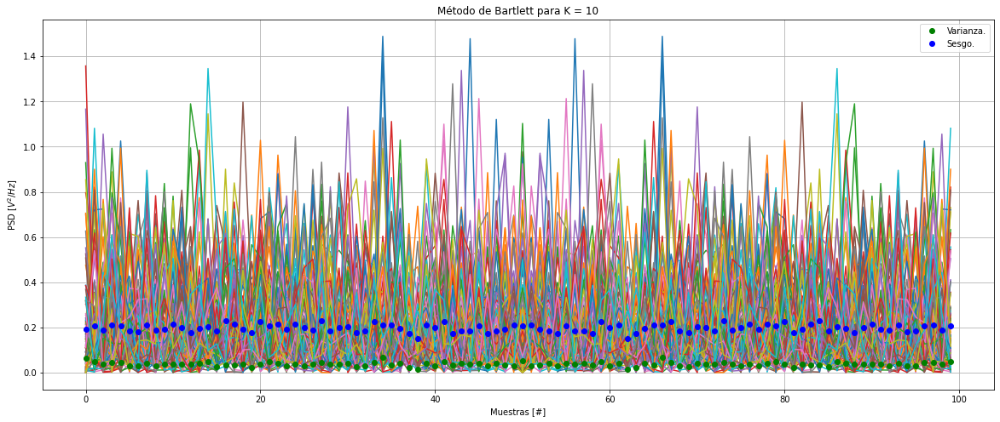

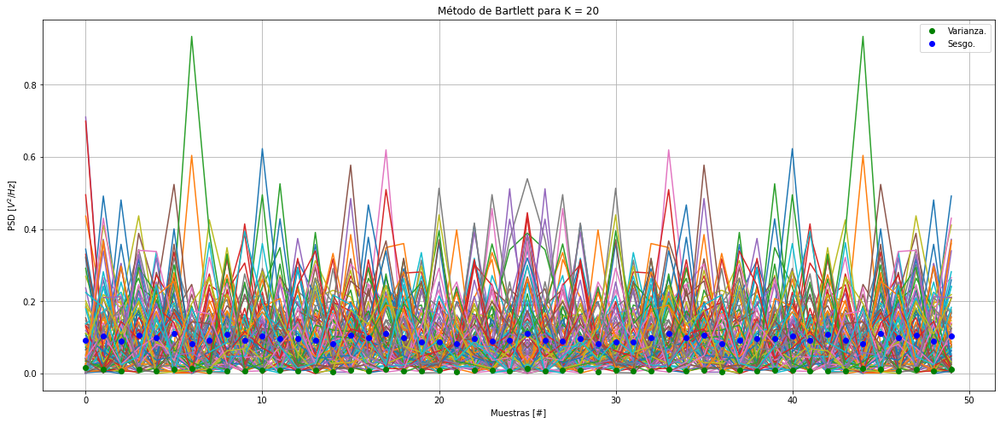

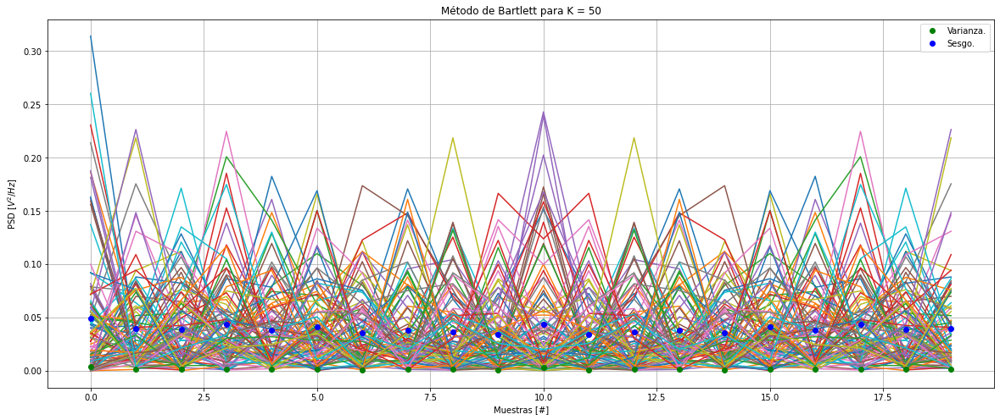

In [30]:
import numpy as npy
import scipy as spy
import matplotlib.pyplot as plt
from scipy import signal

K = npy.array([2, 5, 10, 20, 50])

N = 1000
M = 100 # Realizaciones de señal.
fs = 1000

sigma = 2
mu = 0
k = 0

x = npy.random.normal(mu,npy.sqrt(sigma),(N,M)) # Matriz de muestras de N x M

varianza = []
sesgo = []

# Desarrollo del método de Bartlett.
for i in K:
    L = int((len(x) / i)) # L: longitud de los bloques (1000 / i)
    n1 = 0 # Posición inicial del slice.
    px = 0
    j = 0
   
    bloque = x[n1:n1+L] / i # Division de la muestra en K bloques
                            # de L longitud.
    
    for j in range(i):    
        px = px + ( (abs(npy.fft.fft(bloque,axis=0)) ** 2) / L )
        n1 = n1 + L
        
    # Varianza y sesgo.
    var = npy.var(px,axis=1)
    ses = npy.mean(px,axis=1)    
    
    varianza.append(npy.mean(var))
    sesgo.append(npy.mean(ses) - sigma)
    
    
    # Ploteo
    plt.figure(k,figsize=(20,8))
    plt.plot(px)
    plt.plot(var,'go',label='Varianza.')
    plt.plot(ses,'bo',label='Sesgo.')
    plt.title('Método de Bartlett para K = ' + str(i))
    plt.xlabel('Muestras [#]')
    plt.ylabel('PSD [$V^2 / Hz$]')
    plt.legend()
    plt.grid()
    k=k+1

In [31]:

#######################################
# Tu simulación que genere resultados #
#######################################

tus_resultados_bar = []
tus_resultados_bar.append([sesgo[0],varianza[0]])
tus_resultados_bar.append([sesgo[1],varianza[1]])
tus_resultados_bar.append([sesgo[2],varianza[2]])
tus_resultados_bar.append([sesgo[3],varianza[3]])
tus_resultados_bar.append([sesgo[4],varianza[4]])

"""
tus_resultados_bartlett = [ 
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                 ]"""

df = DataFrame(tus_resultados_bar, columns=['$s_B$', '$v_B$'],
               index=K)
HTML(df.to_html())


,$s_B$,$v_B$
2,-0.993849,0.987145
5,-1.599535,0.158134
10,-1.802207,0.037742
20,-1.903309,0.009009
50,-1.960588,0.001739


<div class="alert alert-block alert-warning">
<b>Comentario:</b> En los gráficos obtenidos se puede evidenciar una dismunición de la resolución espectral a medida que se incrementa el valor de bloques K sobre los que se divide la muestra. Esto es debido a que una mayor cantidad (K) de bloques implica que éstos sean más cortos (menor L).
En cuanto a la tabla de valores, en comparación con el método del punto 1 (periodograma) podemos observar una reducción del sesgo y de la varianza. Además podemos comprobar que la varianza decrece en forma asintótica al aumentar el valor de K. Cabe mencionar que para este caso los bloques no deben ser solapados.
</div>

<div class="alert alert-block alert-info">
<b>3)</b>     Compruebe del mismo modo los resultados de sesgo y varianza vistos en la teoría del método de Welch.

</div>

Es decir, que el periodograma de Welch es un estimador de la densidad de potencia espectral que promedia K bloques ventaneados por $w(n)$, posiblemente solapados de las N muestras de una señal $x$ (Ver Hayes 8.2.5):

$$ \hat{P_W}(k) = \frac{1}{K·L·U}· \sum^{K-1}_{i=0} \Bigg\vert \sum^{L-1}_{n=0}  x(n+i·D) · w(n) · e^{-j2\pi·k·n·\frac{f_S}{N}} \Bigg\vert^2   $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza que decrece asintóticamente, a medida que se promedian más bloques de señal.
 + tiene una resolución espectral inversamente proporcional al tamaño del bloque.

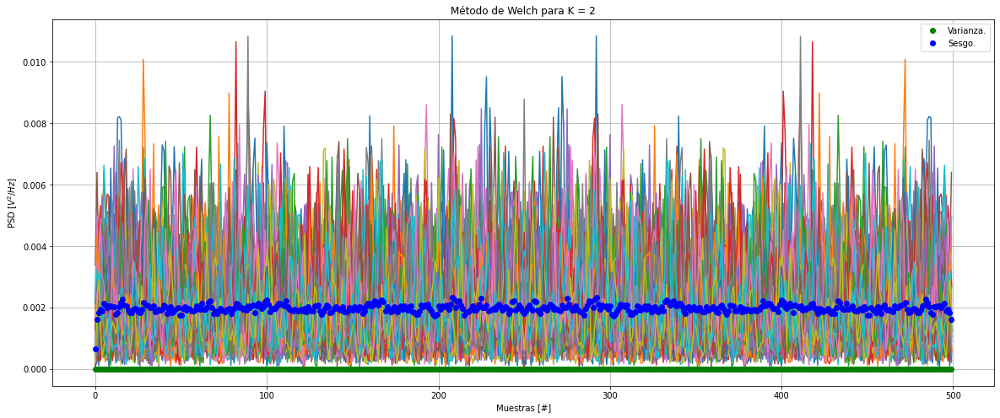

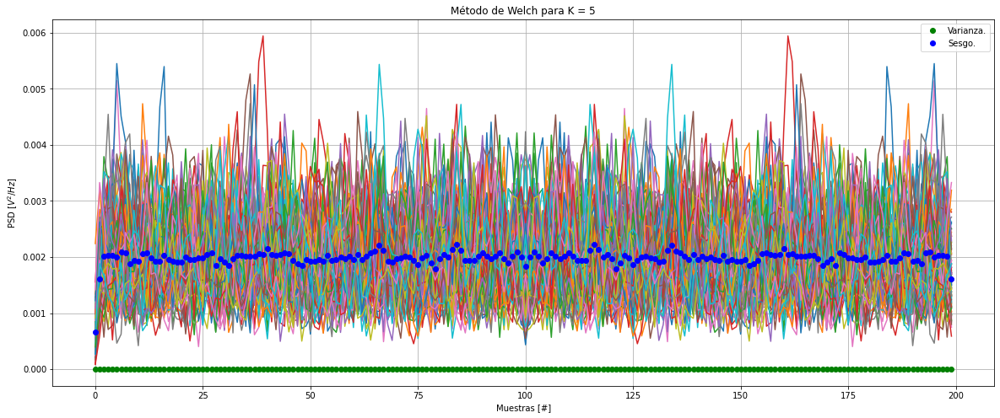

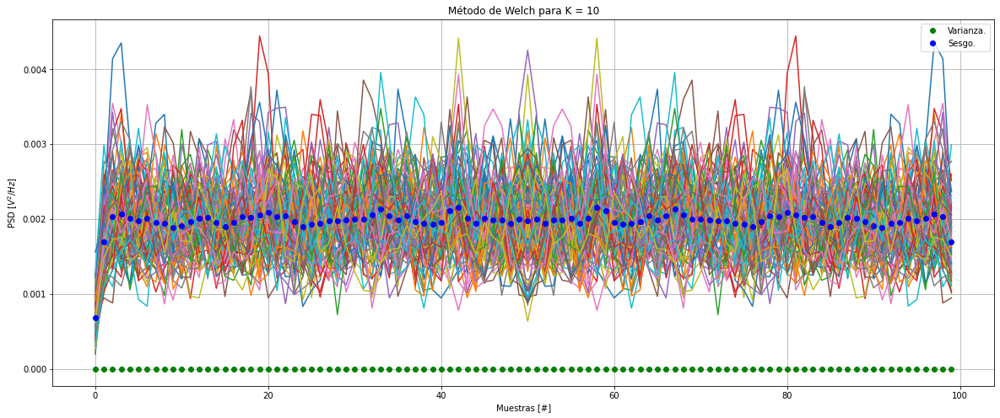

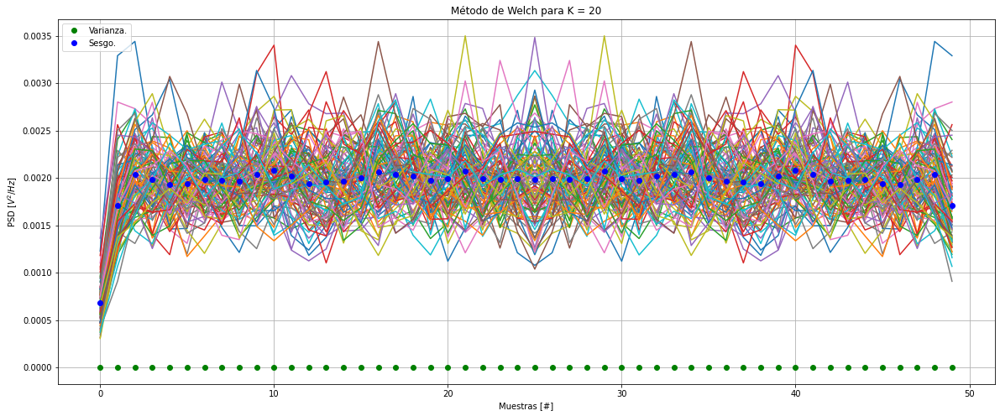

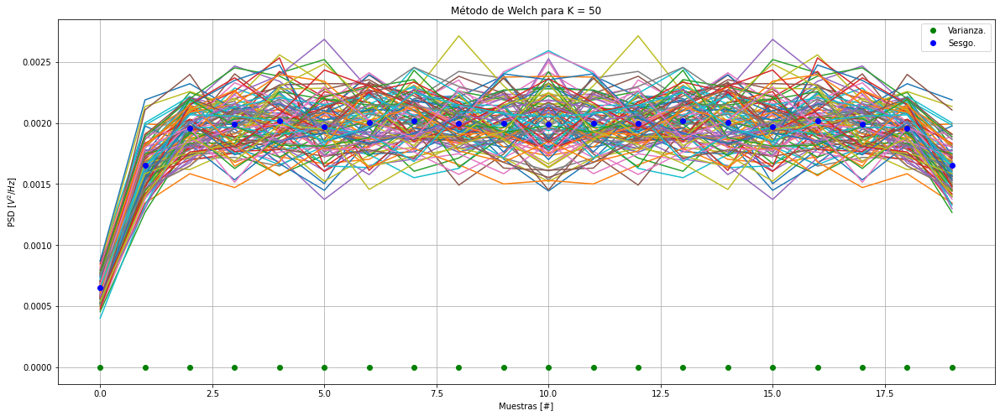

In [37]:
import numpy as npy
import scipy as spy
import matplotlib.pyplot as plt


sigma = 2
mu = 0

fs = 1000
M = 100 # Realizaciones de señal.
N = 1000

k = 0 

K = npy.array([2, 5, 10, 20, 50])
x = npy.random.normal(mu,npy.sqrt(sigma),(N,M))

varianza = []
sesgo = []

for i in K:
    L = int(len(x) / i)
    
    # Método de welch, recibe muestra, frec. de muestreo y longitud de los bloques.
    frec, psd = spy.signal.welch(x,fs,nperseg=L,axis=0,return_onesided=False)
    
    var = npy.var(psd,axis=1)
    varianza.append(npy.mean(var))
    
    ses = npy.mean(psd,axis=1)
    sesgo.append(npy.mean(ses) - sigma)
    
    # Ploteo.
    plt.figure(k,figsize=(20,8))
    plt.plot(psd)
    plt.plot(var,'go',label='Varianza.')
    plt.plot(ses,'bo',label='Sesgo.')
    plt.title('Método de Welch para K = ' + str(i))
    plt.xlabel('Muestras [#]')
    plt.ylabel('PSD [$V^2 / Hz$]')
    plt.legend()
    plt.grid()
    k=k+1   

In [38]:

#######################################
# Tu simulación que genere resultados #
#######################################

tus_resultados_wel = []
tus_resultados_wel.append([sesgo[0],varianza[0]])
tus_resultados_wel.append([sesgo[1],varianza[1]])
tus_resultados_wel.append([sesgo[2],varianza[2]])
tus_resultados_wel.append([sesgo[3],varianza[3]])
tus_resultados_wel.append([sesgo[4],varianza[4]])

"""
tus_resultados_welch = [ 
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                   ['', ''], # <-- acá debería haber numeritos :)
                 ]"""

df = DataFrame(tus_resultados_wel, columns=['$s_B$', '$v_B$'],
               index=K)
HTML(df.to_html())


,$s_B$,$v_B$
2,-1.998015,1.370051e-06
5,-1.998017,4.576453e-07
10,-1.998022,2.128257e-07
20,-1.998040,1.068550e-07
50,-1.998108,4.041352e-08


<div class="alert alert-block alert-warning">
<b>Comentario:</b> En comparación con el método anterior (Bartlett), se observa una disminución en la varianza y se puede comprobar que la misma se reduce asintóticamente al aumentar el tamaño de K. Además, se ve una disminución de sesgo respecto del caso anterior, pero para el método de Welch se mantiene prácticamente constante y no existiría variación al aumentar N. También es evidente la reducción de la resolución espectral al aumentar K.
</div>

<div class="alert alert-block alert-info">
<b>4)</b> Evalue el siguiente estimador de frecuencia de una senoidal contaminada por ruido incorrelado.

</div>

Para una señal $ x(k) = a_1 · \mathop{sen}(\Omega_1·k) + n(k)$

siendo 

  $\Omega_1 = \Omega_0 + f_r·\frac{2\pi}{N} $

  $\Omega_0 = \frac{\pi}{2} $
  
y las variables aleatorias definidas por

  $f_r \sim \mathcal{U}(-\frac{1}{2}, \, \frac{1}{2}) $

  $n \sim \mathcal{N}(0, \, \sigma ^2) $
  
Evalúe el siguiente estimador de $\Omega_1$

  $\hat{\Omega}_1^W = \mathop{arg\ max}_f \{ \hat{P_W} \} $
  
basado en el periodograma de Welch evaluado en **3)**. Del mismo modo, evalúe otro estimador de la PSD para crear otro estimador de $\Omega_1$

  $\hat{\Omega}_1^X = \mathop{arg\ max}_f \{ \hat{P_X} \} $

Considere 200 realizaciones de 1000 muestras para cada experimento. Cada realización debe tener un SNR tal que el pico de la senoidal esté 3 y 10 db por encima del *piso* de ruido impuesto por $n(k)$.


<div class="alert alert-block alert-success">
<b>Ayuda:</b> Puede utilizar el módulo de análisis espectral **Spectrum** donde encontrará la mayoría de los métodos descriptos en el Capítulo 8 del libro de Hayes.

</div>

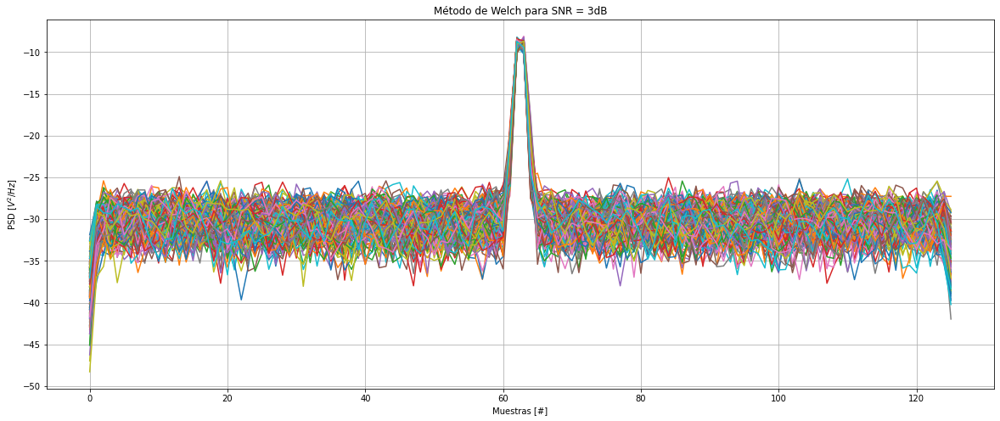

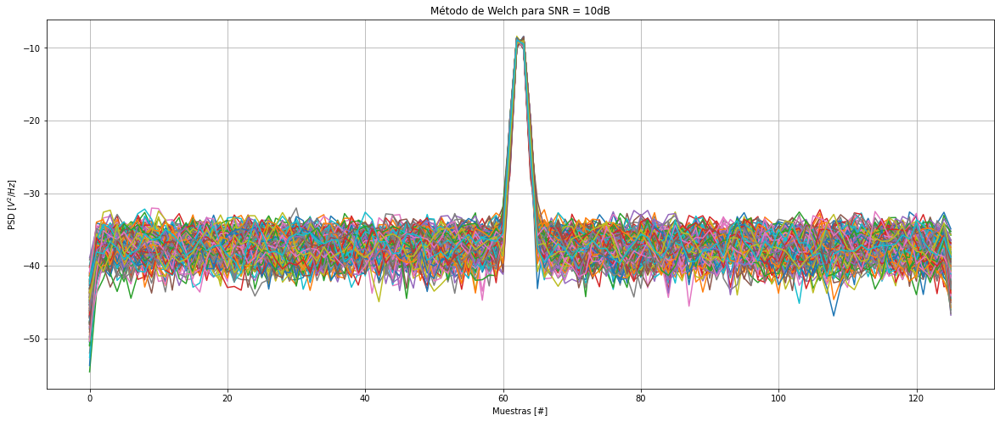

In [41]:
## Testbench para método de welch.

# Parámetros.
fs = 1000
N = 1000
M = 200 # Realizaciones
df = fs/N
mu = 0


# SNR = Ps - Pr = 10 log (a1^2) - 10 log (sigma^2)
SNR = npy.array([3,10])
a1 = npy.sqrt(2)
sigma2 = a1**2 * (1 / (2 * 10 ** (SNR / 10)))

# Variables aleatorias.
fr = npy.random.uniform(-0.5,0.5,M)
n_3dB = npy.random.normal(mu,npy.sqrt(sigma2[0]),(N,M))
n_10dB = npy.random.normal(mu,npy.sqrt(sigma2[1]),(N,M))

# Frecuencia.
o0 = fs / 4
o1 = o0 + fr * df 

# Senoidal con ruido incorrelado.
t = npy.zeros((1000,200))
tt = npy.arange(df, step=1/fs)
t = t + tt[:,None] 

senoidal = a1 * npy.sin(2 * npy.pi * o1 * t)
x_3dB = senoidal + n_3dB
x_10dB = senoidal + n_10dB


# Aplicación del método de Welch para analizar las potencias.
fa, pr_3dB = spy.signal.welch(n_3dB,fs,axis=0,nperseg=N/4)
fb, pr_10dB = spy.signal.welch(n_10dB,fs,axis=0,nperseg=N/4)
fc, ps = spy.signal.welch(senoidal,fs,axis=0,nperseg=N/4)

pr_3dB = npy.mean(pr_3dB)
pr_10dB = npy.mean(pr_10dB)
ps = npy.mean(ps)

# Aplicación del método de Welch para periodograma.
frec3, psd_3dB = spy.signal.welch(x_3dB,fs,axis=0,nperseg=N/4)
frec10, psd_10dB = spy.signal.welch(x_10dB,fs,axis=0,nperseg=N/4)

# Indicadores.
ow_3dB = npy.argmax(psd_3dB,axis=0)
ow_10dB = npy.argmax(psd_10dB,axis=0)

error_3dB = frec3[ow_3dB] - o1
error_10dB = frec10[ow_10dB] - o1

valor_esperado_3dB = npy.mean(psd_3dB)
valor_esperado_10dB = npy.mean(psd_10dB)

varianza_3dB = npy.mean(npy.var(psd_3dB,axis=1))
varianza_10dB =npy.mean(npy.var(psd_10dB,axis=1))

# Ploteo
plt.figure(1,figsize=(20,8))
plt.plot(10*npy.log10(psd_3dB))
plt.title('Método de Welch para SNR = 3dB')
plt.xlabel('Muestras [#]')
plt.ylabel('PSD [$V^2 / Hz$]')
plt.grid()

plt.figure(2,figsize=(20,8))
plt.plot(10*npy.log10(psd_10dB))
plt.title('Método de Welch para SNR = 10dB')
plt.xlabel('Muestras [#]')
plt.ylabel('PSD [$V^2 / Hz$]')
plt.grid()


<ipython-input-51-c3111eaf4cec>:20: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10*npy.log10(px_3dB))
<ipython-input-51-c3111eaf4cec>:28: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10*npy.log10(px_10dB))


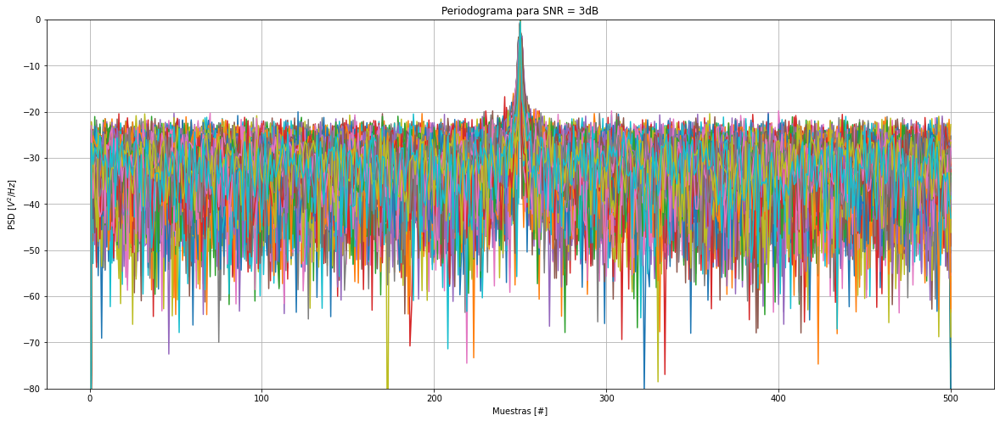

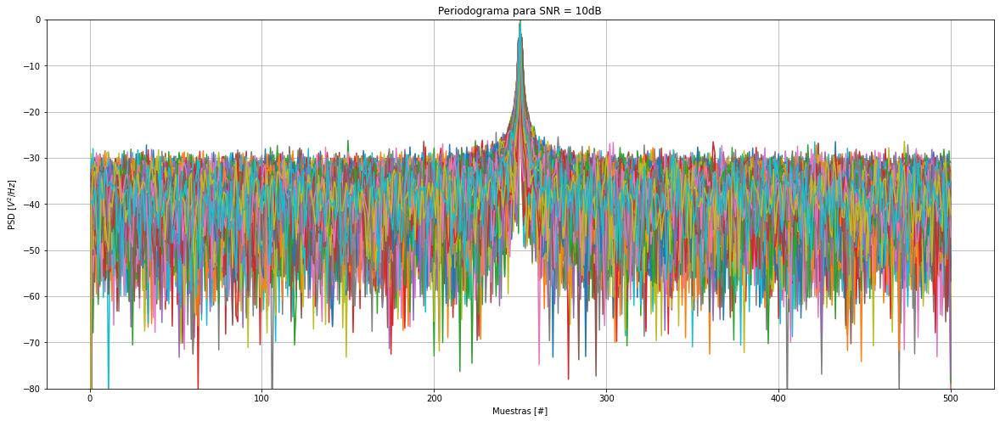

In [51]:
# Aplico periodograma de scipy.
ff3,px_3dB = spy.signal.periodogram(x_3dB,fs,axis=0)
ff10,px_10dB = spy.signal.periodogram(x_10dB,fs,axis=0) 

# Indicadores.
pow_3dB = npy.argmax(px_3dB,axis=0)
pow_10dB = npy.argmax(px_10dB,axis=0)

perror_3dB = ff3[pow_3dB] - o1
perror_10dB = ff10[pow_10dB] - o1

pvalor_esperado_3dB = npy.mean(px_3dB)
pvalor_esperado_10dB = npy.mean(px_10dB)

pvarianza_3dB = npy.mean(npy.var(px_3dB,axis=1))
pvarianza_10dB =npy.mean(npy.var(px_10dB,axis=1))

# Ploteo
plt.figure(1,figsize=(20,8))
plt.plot(10*npy.log10(px_3dB))
plt.ylim(-80,0)
plt.title('Periodograma para SNR = 3dB')
plt.xlabel('Muestras [#]')
plt.ylabel('PSD [$V^2 / Hz$]')
plt.grid()

plt.figure(2,figsize=(20,8))
plt.plot(10*npy.log10(px_10dB))
plt.ylim(-80,0)
plt.title('Periodograma para SNR = 10dB')
plt.xlabel('Muestras [#]')
plt.ylabel('PSD [$V^2 / Hz$]')
plt.grid()

In [54]:
## Prints de indicadores para ambos métodos.

print('Indicadores usando método de Welch.')
print('Fcia. de argmax 3dB: ' + str(npy.mean(ow_3dB)))
print('Fcia. de argmax 10dB: ' + str(npy.mean(ow_3dB)))
print('Error 3dB: ' + str(npy.mean(error_3dB)))
print('Error 10dB: ' + str(npy.mean(error_10dB)))
print('Valor esperado 3dB: ' + str(valor_esperado_3dB))
print('Valor esperado 10dB: ' + str(valor_esperado_10dB))
print('Varianza 3dB: ' + str(varianza_3dB))
print('Varianza 10dB: ' + str(varianza_10dB))
print('')
print('Indicadores usando Periodograma.')
print('Fcia. de argmax 3dB: ' + str(npy.mean(pow_3dB)))
print('Fcia. de argmax 10dB: ' + str(npy.mean(pow_3dB)))
print('Error 3dB: ' + str(npy.mean(perror_3dB)))
print('Error 10dB: ' + str(npy.mean(perror_10dB)))
print('Valor esperado 3dB: ' + str(pvalor_esperado_3dB))
print('Valor esperado 10dB: ' + str(pvalor_esperado_10dB))
print('Varianza 3dB: ' + str(pvarianza_3dB))
print('Varianza 10dB: ' + str(pvarianza_10dB))

Indicadores usando método de Welch.
Fcia. de argmax 3dB: 62.495
Fcia. de argmax 10dB: 62.495
Error 3dB: -0.013590943055391307
Error 10dB: 0.026409056944608694
Valor esperado 3dB: 0.002980245234275758
Valor esperado 10dB: 0.002186268622257671
Varianza 3dB: 2.9260840734233856e-06
Varianza 10dB: 2.363253588808293e-06

Indicadores usando Periodograma.
Fcia. de argmax 3dB: 250.01
Fcia. de argmax 10dB: 250.01
Error 3dB: 0.01640905694460869
Error 10dB: 0.011409056944608692
Valor esperado 3dB: 0.002998749102739286
Valor esperado 10dB: 0.002197733345295519
Varianza 3dB: 0.0001265353387017565
Varianza 10dB: 0.00012419090834456638


   a) ¿Qué estimador ha elegido? Explique brevemente los fundamentos principales y el enfoque del método elegido.


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> Utilicé el periodograma de la librería scipy. Esto es debido a que el mismo ya había sido analizado y desarrollado en el punto 1 para estimar la densidad espectral de potencia. De esta manera, como se oserva en los gráficos obtenidos, puedo realizar un análisis con una mejor resolución del espectro.
</div>

   b) ¿Qué indicador considera que sería apropiado para poder comparar el rendimiento de ambos estimadores $i_j$?


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> He realizado una lista con los resultados de varios tipos de indicadores con los que puedo realizar una comparación precisa para ambos estimadores. Sin embargo determino que los indicadores fundamentales son el sesgo y la varianza. Para este caso utilizaré el sesgo ya que un estimador insesgado nos proporcionará un valor más cercano al real.
</div>

In [7]:

#######################################
# Tu simulación que genere resultados #
#######################################
from pandas import DataFrame
from IPython.display import HTML

# Una vez definido tu indicador de performance, calculalo y comparalo para las situaciones pedidas.
tus_resultados = [ 
                   ['0.013', '0.016'], # <-- acá debería haber numeritos :)
                   ['0.026', '0.011'] # <-- acá debería haber numeritos :)
                 ]
df = pd.DataFrame(tus_resultados, columns=['$i_W$', '$i_X$'],
               index=[  
                        '3 dB',
                        '10 dB'
                     ])
HTML(df.to_html())


,$i_W$,$i_X$
3 dB,0.013,0.016
10 dB,0.026,0.011
